In [2]:
import pandas as pd
import utils
import os
import json
from datetime import datetime
import geopandas as gpd

c:\Users\agand\OneDrive\Escritorio\lakes\lake-algae-analysis\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from 'c:\\Users\\agand\\OneDrive\\Escritorio\\lakes\\lake-algae-analysis\\notebooks\\utils.py'>

In [150]:
current_dir = os.getcwd()
parent_dir = os.path.dirname(current_dir)
data_dir = os.path.join(parent_dir, 'data')

universities_path = os.path.join(data_dir, 'Universities.csv')
universities = pd.read_csv(universities_path, encoding='ISO-8859-1')

In [151]:
universities

,name,university,Uni Classification,State,Pin Code,Year of Formation,longitude,latitude
0,Abhilashi University,abhilashi university,Private,Himachal Pradesh,175028,2015,77.0354,31.5144
1,Academy Of Maritime Education And Training,academy of maritime education and training,Deemed,Tamil Nadu,603112,2007,80.2328,12.7642
2,Acharya Nagarjuna University,acharya nagarjuna university,State,Andhra Pradesh,522510,1976,80.5468,16.4571
3,Acharya Ng Ranga Agricultural University,acharya ng ranga agricultural university,State,Telangana,500030,1964,78.3935,17.3354
4,Adamas University,adamas university,Private,West Bengal,700126,2014,88.4379,22.7423
...,...,...,...,...,...,...,...,...
716,Xavier University,xavier university,Private,Odisha,751013,2013,85.8221,20.3043
717,Yashwant Rao Chavan Maharashtra Open University,yashwant rao chavan maharashtra open university,State,Maharashtra,422222,1990,73.9080,20.0067
718,Yenepoya University,yenepoya university,Deemed,Karnataka,575018,2008,74.9322,12.7832
719,YMCA University of Science & Technology,ymca university of science & technology,State,Haryana,121006,2009,77.3420,28.3676


In [152]:
first50_universities = universities.head(50)

Finding lakes of university number 0
Finding lakes of university number 1
Finding lakes of university number 2
Finding lakes of university number 3
Finding lakes of university number 4


c:\Users\agand\OneDrive\Escritorio\lakes\lake-algae-analysis\.venv\Lib\site-packages\shapely\decorators.py:79: ResourceWarning: unclosed <socket.socket fd=4532, family=2, type=1, proto=0, laddr=('192.168.1.218', 61799), raddr=('162.55.144.139', 443)>
  for arr, old_flag in zip(array_args, old_flags):


Finding lakes of university number 5
Finding lakes of university number 6
Finding lakes of university number 7
Finding lakes of university number 8
Finding lakes of university number 9
Finding lakes of university number 10
Finding lakes of university number 11
Finding lakes of university number 12
Finding lakes of university number 13
Finding lakes of university number 14
Finding lakes of university number 15
Finding lakes of university number 16
Finding lakes of university number 17
Finding lakes of university number 18
Finding lakes of university number 19
Finding lakes of university number 20
Finding lakes of university number 21
Finding lakes of university number 22
Finding lakes of university number 23
Finding lakes of university number 24
Finding lakes of university number 25
Finding lakes of university number 26
Finding lakes of university number 27
Finding lakes of university number 28
Finding lakes of university number 29
Finding lakes of university number 30
Finding lakes of 

c:\Users\agand\OneDrive\Escritorio\lakes\lake-algae-analysis\notebooks\utils.py:242: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  universities["geometry"] = universities.apply(


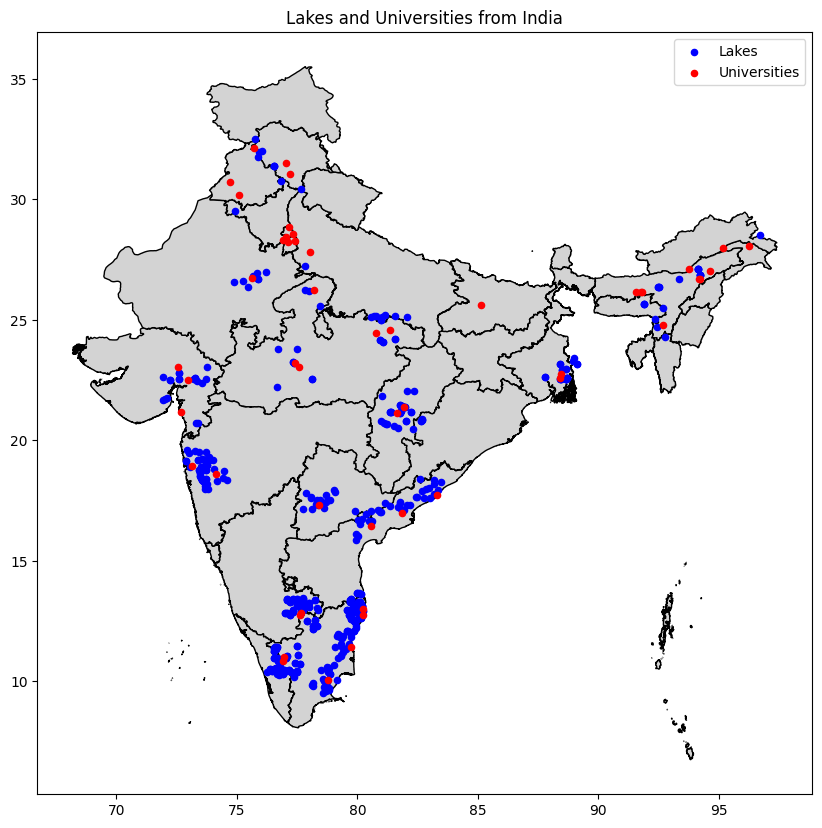

In [157]:
first50unviersities_all_lakes = utils.get_all_lakes(first50_universities, 75000, area = 800000)

### Save pixel_size, pixel_count and total_pixel_area in all_lakes.csv

In [24]:
current_dir = os.getcwd()
parent_dir = os.path.dirname(current_dir)
data_dir = os.path.join(parent_dir, 'data')

lakes_path = os.path.join(data_dir, 'all_lakes.csv')
lakes = pd.read_csv(lakes_path, encoding='ISO-8859-1')

In [25]:
lakes

,osmid,name,area,distance,water,university,centroid_long,centroid_lat
0,277584,Dhom reservoir,1.290209e+07,79414.962954,reservoir,Ajeenkya D Y Patil University,73.788666,17.979079
1,278303,Pimpalgaon Joga Reservoir,2.154465e+07,86045.584675,reservoir,Amity University,73.838884,19.329037
2,278467,Yedgaon Reservoir,8.330740e+06,64936.430140,reservoir,Ajeenkya D Y Patil University,73.991282,19.182565
3,311633,Vihar Lake,4.768830e+06,31244.525996,reservoir,Amity University,72.911029,19.153996
4,332072,Maharana Pratap Reservoir,2.326225e+08,34042.231935,reservoir,Arni University,76.054553,31.996504
...,...,...,...,...,...,...,...,...
355,11913421_1,NaN,1.561140e+06,96662.926046,NaN,Amity University,82.673424,20.853837
356,13346368_1,NaN,5.019920e+06,73761.543515,NaN,Awadesh Pratap Singh University,81.147162,25.210485
357,1868190_0,NaN,3.262787e+06,3920.423949,NaN,Atal Bihari Vajpai Hindi Vishwavidyalaya,77.392836,23.198233
358,7538927_0,NaN,1.949978e+06,87846.226771,NaN,Azim Premji University,77.065449,13.385130


In [26]:
lakes[["pixel_size", "pixel_count"]] = lakes["osmid"].apply(lambda osmid: pd.Series(utils.calculate_pixel_size_and_pixel_count(osmid)))

In [27]:
lakes["total_pixel_area"] = lakes['pixel_count'] * (lakes["pixel_size"]**2)

In [28]:
lakes.to_csv("../data/all_lakes_with_pixels.csv")

In [46]:
logs, images = utils.get_historical_lake_log(332072, datetime(2020, 6, 1), datetime(2020, 7, 1))

c:\Users\agand\OneDrive\Escritorio\lakes\lake-algae-analysis\notebooks\utils.py:660: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


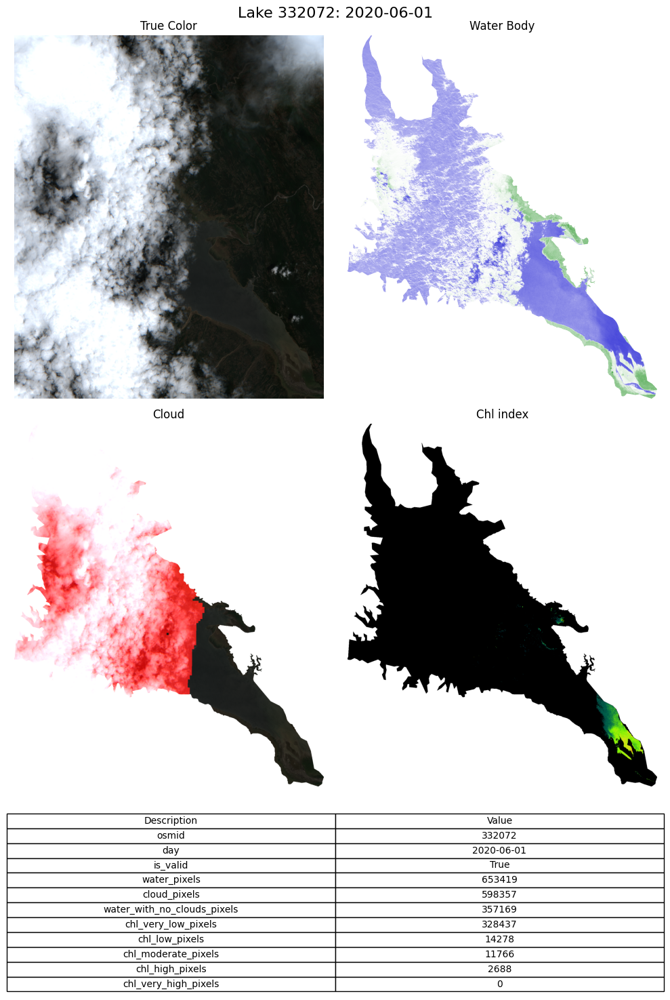

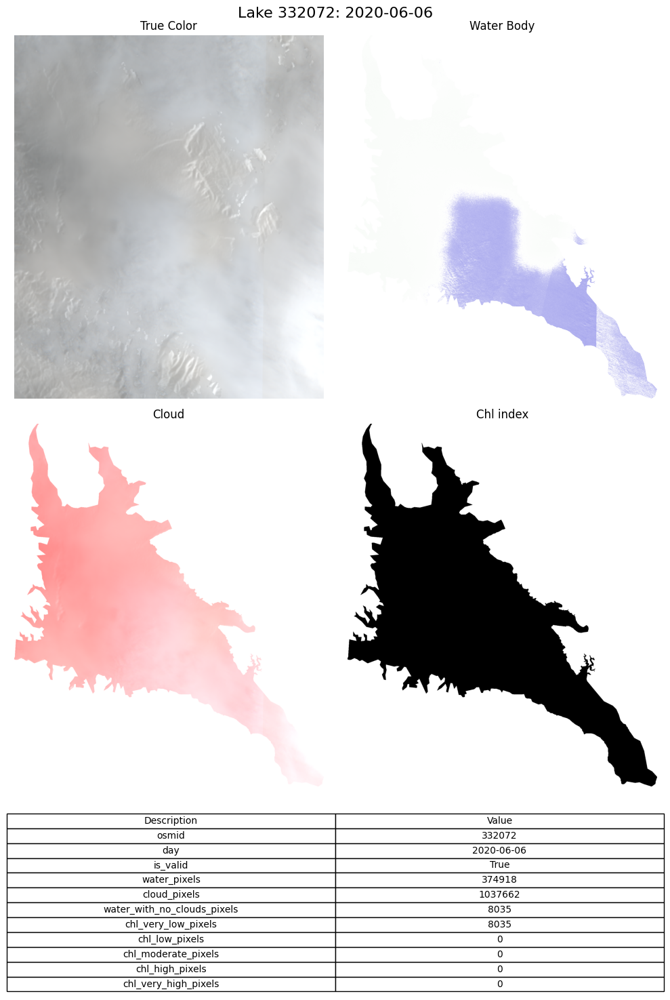

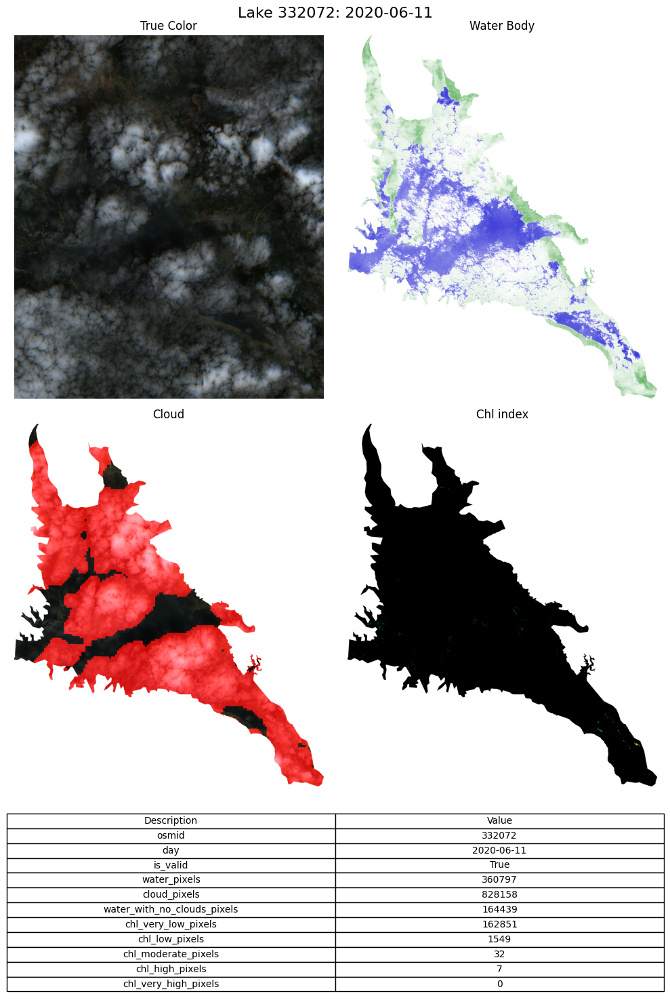

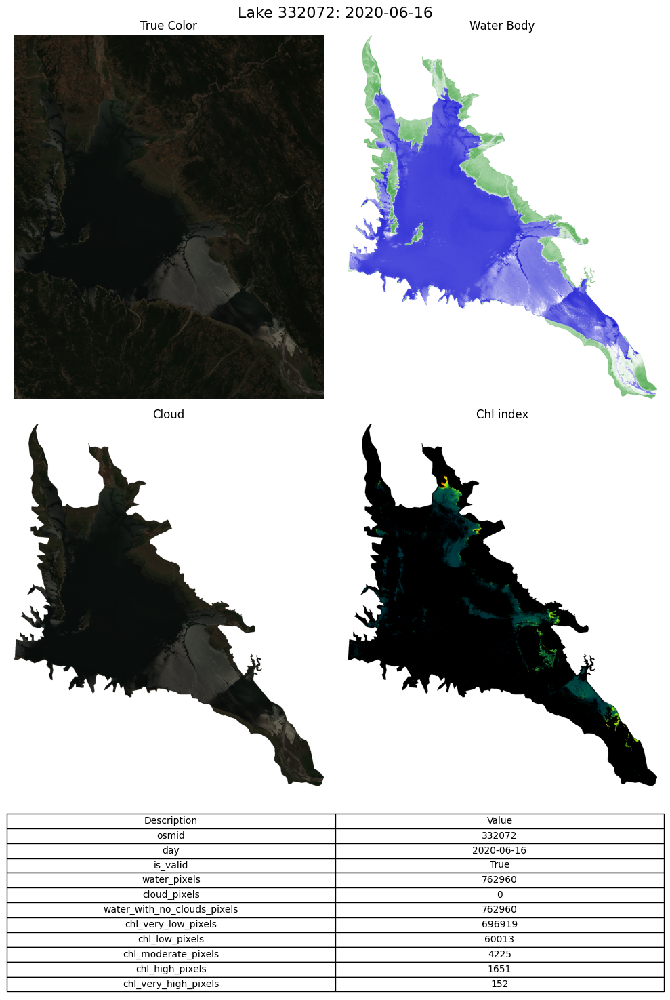

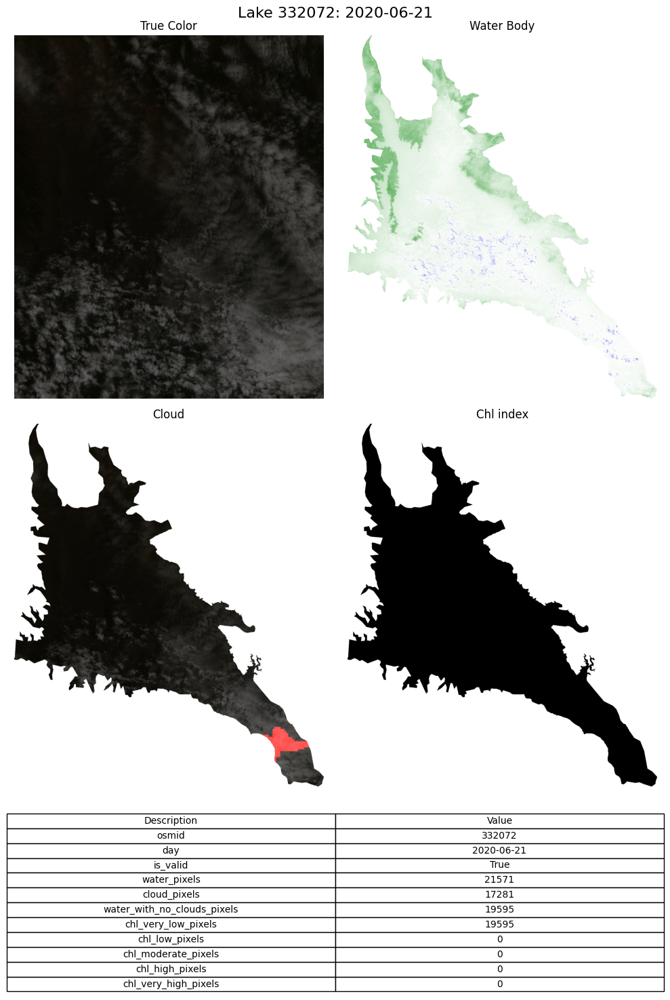

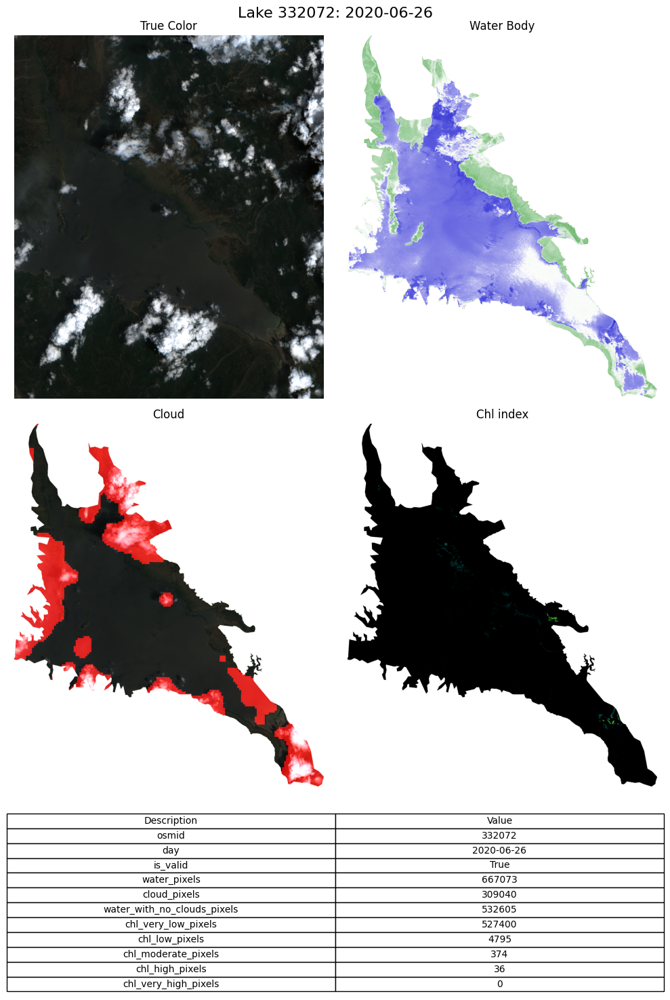

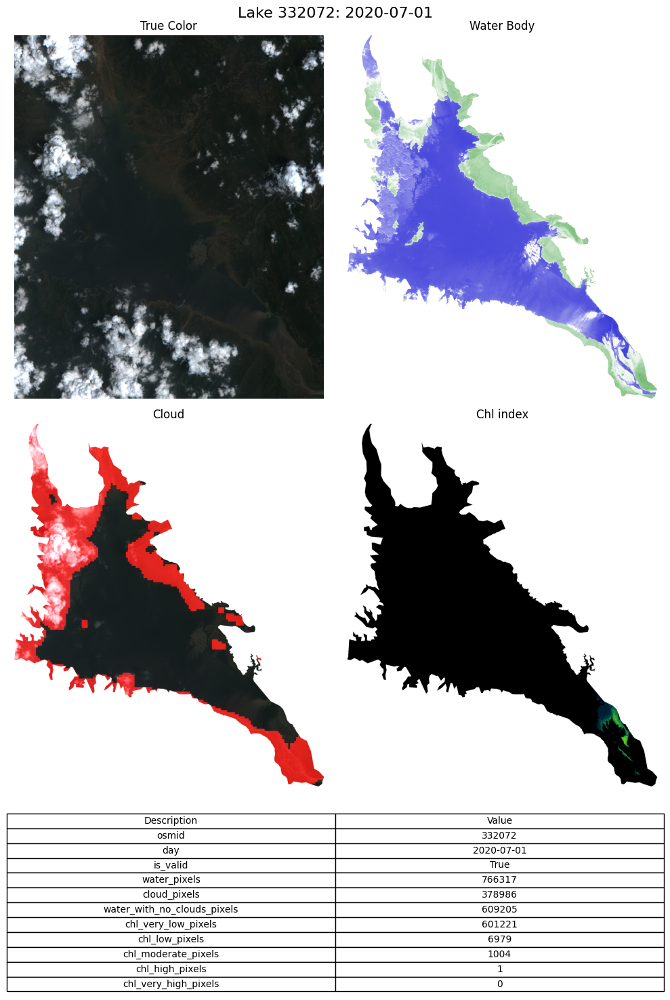

In [47]:

logs, images = utils.get_historical_lake_log(332072, datetime(2020, 6, 1), datetime(2020, 7, 1))
utils.plot_historical_lake_logs(logs, images)

In [54]:
lakes = pd.read_csv("..")

,osmid,name,area,distance,water,university,centroid_long,centroid_lat,pixel_size,pixel_count
0,311633,Vihar Lake,4.768830e+06,31244.525996,reservoir,Amity University,72.911029,19.153996,5,196032
1,332072,Maharana Pratap Reservoir,2.326225e+08,34042.231935,reservoir,Arni University,76.054553,31.996504,15,1039287
2,1579454,Yeleru Reservoir,4.753580e+07,44401.006783,reservoir,Adikavi Nannaya University,82.063486,17.322695,5,1916439
3,1601368,Gobind Sagar,1.288780e+08,48946.638589,reservoir,Abhilashi University,76.542951,31.385295,20,324139
4,1606905,Shabd Lake,9.741317e+05,35061.569722,lake,Acharya Ng Ranga Agricultural University,78.121256,17.157075,5,39118
...,...,...,...,...,...,...,...,...,...,...
203,1286534028,NaN,5.022915e+06,37783.049460,lake,Amity University,73.428460,18.778483,5,200991
204,1288299018,NaN,1.123596e+06,49607.183040,lake,Adamas University,88.391077,23.188206,5,44969
205,1305543054,NaN,1.036691e+06,17787.735627,pond,Adikavi Nannaya University,81.936821,17.114065,5,41408
206,1306977512,NaN,8.456305e+05,20605.772133,pond,Adikavi Nannaya University,81.805987,17.172767,5,33645


In [55]:
first50unviersities_all_lakes["total_pixel_area"] = first50unviersities_all_lakes['pixel_count'] * (first50unviersities_all_lakes["pixel_size"]**2)

first50unviersities_all_lakes

,osmid,name,area,distance,water,university,centroid_long,centroid_lat,pixel_size,pixel_count,total_pixel_area
0,311633,Vihar Lake,4.768830e+06,31244.525996,reservoir,Amity University,72.911029,19.153996,5,196032,4900800
1,332072,Maharana Pratap Reservoir,2.326225e+08,34042.231935,reservoir,Arni University,76.054553,31.996504,15,1039287,233839575
2,1579454,Yeleru Reservoir,4.753580e+07,44401.006783,reservoir,Adikavi Nannaya University,82.063486,17.322695,5,1916439,47910975
3,1601368,Gobind Sagar,1.288780e+08,48946.638589,reservoir,Abhilashi University,76.542951,31.385295,20,324139,129655600
4,1606905,Shabd Lake,9.741317e+05,35061.569722,lake,Acharya Ng Ranga Agricultural University,78.121256,17.157075,5,39118,977950
...,...,...,...,...,...,...,...,...,...,...,...
203,1286534028,NaN,5.022915e+06,37783.049460,lake,Amity University,73.428460,18.778483,5,200991,5024775
204,1288299018,NaN,1.123596e+06,49607.183040,lake,Adamas University,88.391077,23.188206,5,44969,1124225
205,1305543054,NaN,1.036691e+06,17787.735627,pond,Adikavi Nannaya University,81.936821,17.114065,5,41408,1035200
206,1306977512,NaN,8.456305e+05,20605.772133,pond,Adikavi Nannaya University,81.805987,17.172767,5,33645,841125


In [56]:
first50unviersities_all_lakes["ratio"] = first50unviersities_all_lakes["area"]/first50unviersities_all_lakes["total_pixel_area"]
first50unviersities_all_lakes

,osmid,name,area,distance,water,university,centroid_long,centroid_lat,pixel_size,pixel_count,total_pixel_area,ratio
0,311633,Vihar Lake,4.768830e+06,31244.525996,reservoir,Amity University,72.911029,19.153996,5,196032,4900800,0.973072
1,332072,Maharana Pratap Reservoir,2.326225e+08,34042.231935,reservoir,Arni University,76.054553,31.996504,15,1039287,233839575,0.994795
2,1579454,Yeleru Reservoir,4.753580e+07,44401.006783,reservoir,Adikavi Nannaya University,82.063486,17.322695,5,1916439,47910975,0.992169
3,1601368,Gobind Sagar,1.288780e+08,48946.638589,reservoir,Abhilashi University,76.542951,31.385295,20,324139,129655600,0.994003
4,1606905,Shabd Lake,9.741317e+05,35061.569722,lake,Acharya Ng Ranga Agricultural University,78.121256,17.157075,5,39118,977950,0.996096
...,...,...,...,...,...,...,...,...,...,...,...,...
203,1286534028,NaN,5.022915e+06,37783.049460,lake,Amity University,73.428460,18.778483,5,200991,5024775,0.999630
204,1288299018,NaN,1.123596e+06,49607.183040,lake,Adamas University,88.391077,23.188206,5,44969,1124225,0.999440
205,1305543054,NaN,1.036691e+06,17787.735627,pond,Adikavi Nannaya University,81.936821,17.114065,5,41408,1035200,1.001440
206,1306977512,NaN,8.456305e+05,20605.772133,pond,Adikavi Nannaya University,81.805987,17.172767,5,33645,841125,1.005357


In [60]:
first50unviersities_all_lakes["true_ratio"] = (first50unviersities_all_lakes['ratio'] >= 0.95) & (first50unviersities_all_lakes['ratio'] <= 1.05)
first50unviersities_all_lakes

,osmid,name,area,distance,water,university,centroid_long,centroid_lat,pixel_size,pixel_count,total_pixel_area,ratio,true_ratio
0,311633,Vihar Lake,4.768830e+06,31244.525996,reservoir,Amity University,72.911029,19.153996,5,196032,4900800,0.973072,True
1,332072,Maharana Pratap Reservoir,2.326225e+08,34042.231935,reservoir,Arni University,76.054553,31.996504,15,1039287,233839575,0.994795,True
2,1579454,Yeleru Reservoir,4.753580e+07,44401.006783,reservoir,Adikavi Nannaya University,82.063486,17.322695,5,1916439,47910975,0.992169,True
3,1601368,Gobind Sagar,1.288780e+08,48946.638589,reservoir,Abhilashi University,76.542951,31.385295,20,324139,129655600,0.994003,True
4,1606905,Shabd Lake,9.741317e+05,35061.569722,lake,Acharya Ng Ranga Agricultural University,78.121256,17.157075,5,39118,977950,0.996096,True
...,...,...,...,...,...,...,...,...,...,...,...,...,...
203,1286534028,NaN,5.022915e+06,37783.049460,lake,Amity University,73.428460,18.778483,5,200991,5024775,0.999630,True
204,1288299018,NaN,1.123596e+06,49607.183040,lake,Adamas University,88.391077,23.188206,5,44969,1124225,0.999440,True
205,1305543054,NaN,1.036691e+06,17787.735627,pond,Adikavi Nannaya University,81.936821,17.114065,5,41408,1035200,1.001440,True
206,1306977512,NaN,8.456305e+05,20605.772133,pond,Adikavi Nannaya University,81.805987,17.172767,5,33645,841125,1.005357,True


In [61]:
first50unviersities_all_lakes[first50unviersities_all_lakes.true_ratio == False]

,osmid,name,area,distance,water,university,centroid_long,centroid_lat,pixel_size,pixel_count,total_pixel_area,ratio,true_ratio
5,1624070,Pulicat Lake,5.605353e+08,69036.566401,lake,Anna University,80.160980,13.630831,25,1053149,658218125,0.851595,False
7,1866836,NaN,6.576754e+06,39834.948658,reservoir,Amity University,77.817211,26.244938,5,278082,6952050,0.946016,False
8,1868190,Kaliasot Lake,3.301417e+06,3939.591870,reservoir,Atal Bihari Vajpai Hindi Vishwavidyalaya,77.392603,23.198310,10,288468,28846800,0.114447,False
14,2310417,Madivala Lake,8.284080e+05,8078.970264,lake,Azim Premji University,77.616331,12.906492,20,59559,23823600,0.034773,False
43,8503824,Chimminy Reservoir,7.895011e+06,64736.192875,reservoir,Amrita Vishwa Vidyapeetham,76.480103,10.439083,5,334704,8367600,0.943522,False
45,8810862,Malampuzha Lake,1.922656e+07,24808.864028,reservoir,Amrita Vishwa Vidyapeetham,76.689167,10.847262,5,827825,20695625,0.929016,False
52,10191256,Umda Sagar,9.323527e+05,8237.401503,lake,Acharya Ng Ranga Agricultural University,78.456311,17.291881,15,68579,15430275,0.060424,False
54,11339483,Jhangh Lake,9.806808e+05,14018.044273,lake,Ayush And Health Science University,81.770601,21.147025,5,43908,1097700,0.893396,False
96,58680339,Tawa Reservoir,3.797087e+07,73757.687707,reservoir,Aisect University,78.099099,22.565311,10,361487,36148700,1.050408,False


c:\Users\agand\OneDrive\Escritorio\lakes\lake-algae-analysis\notebooks\utils.py:660: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


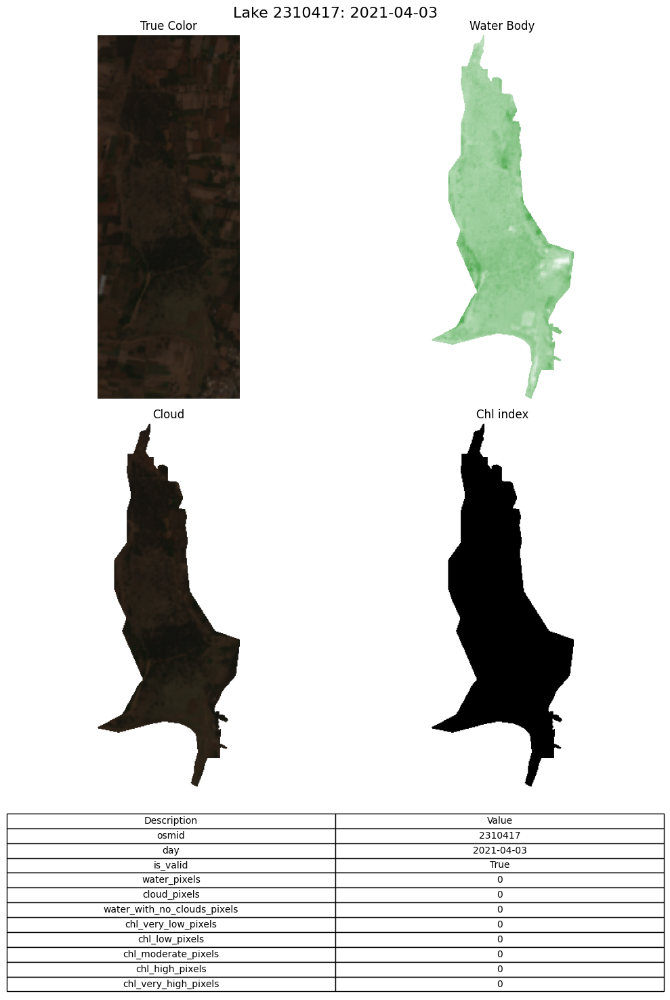

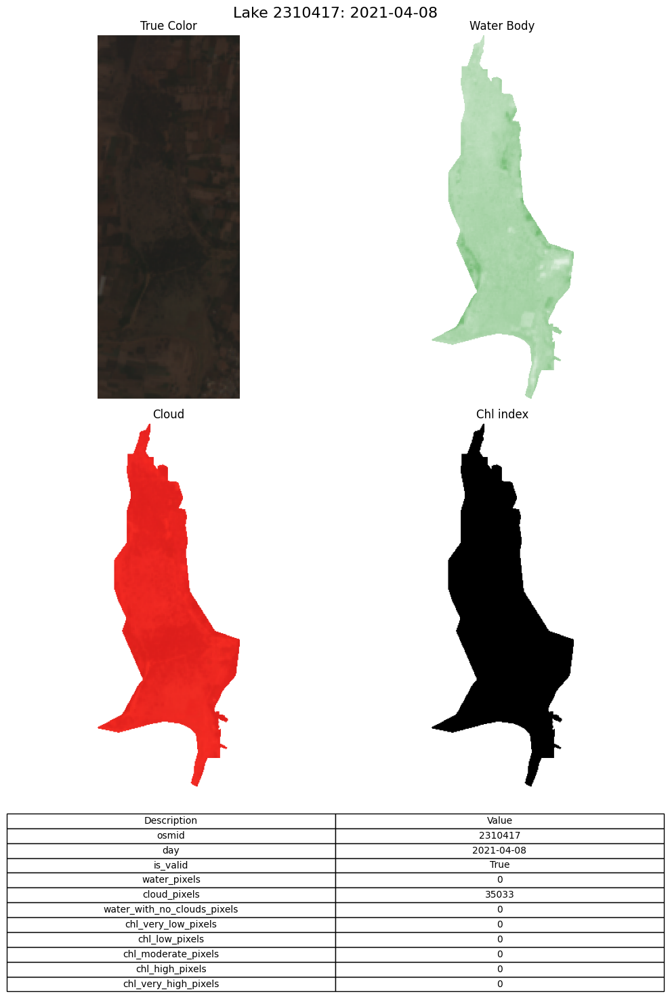

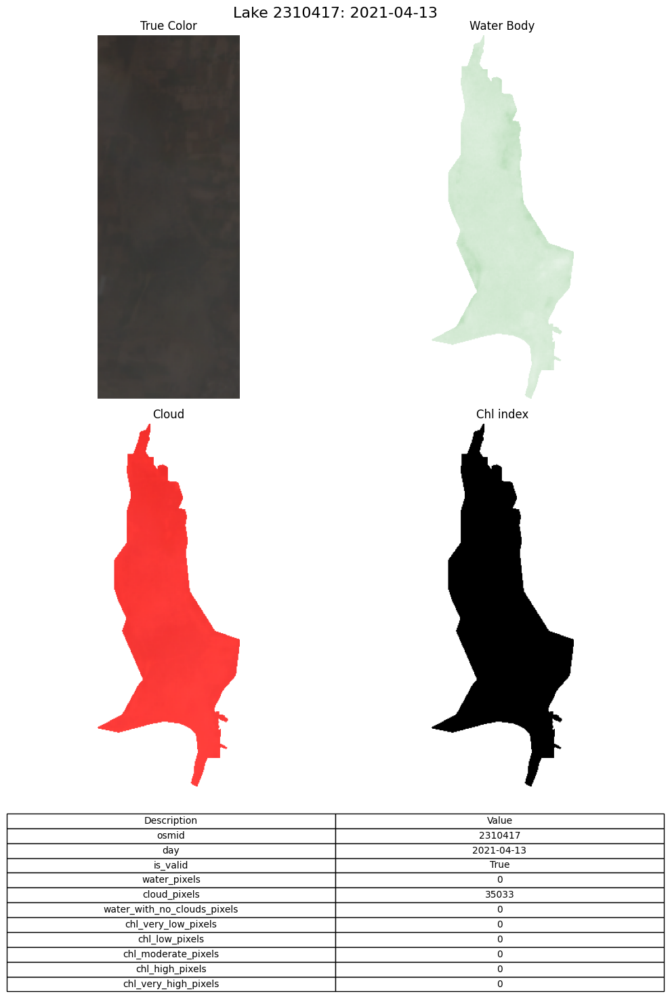

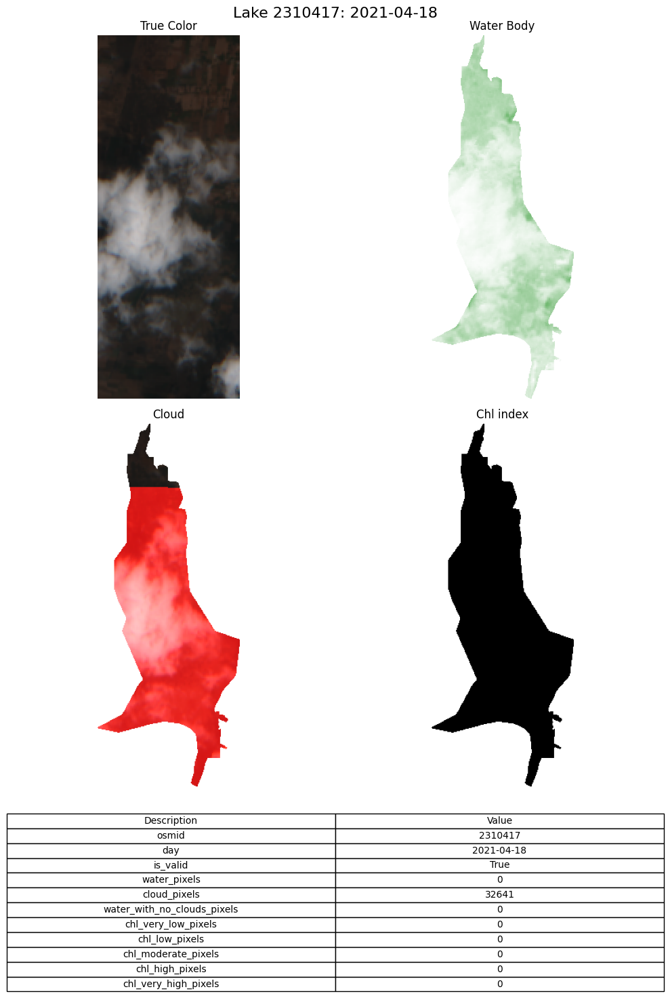

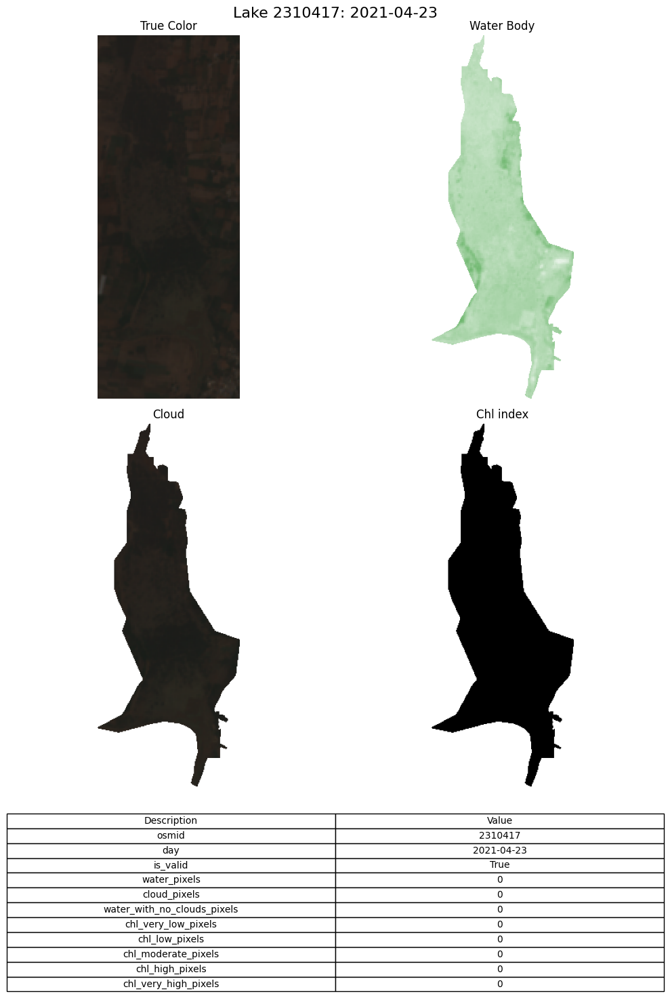

...

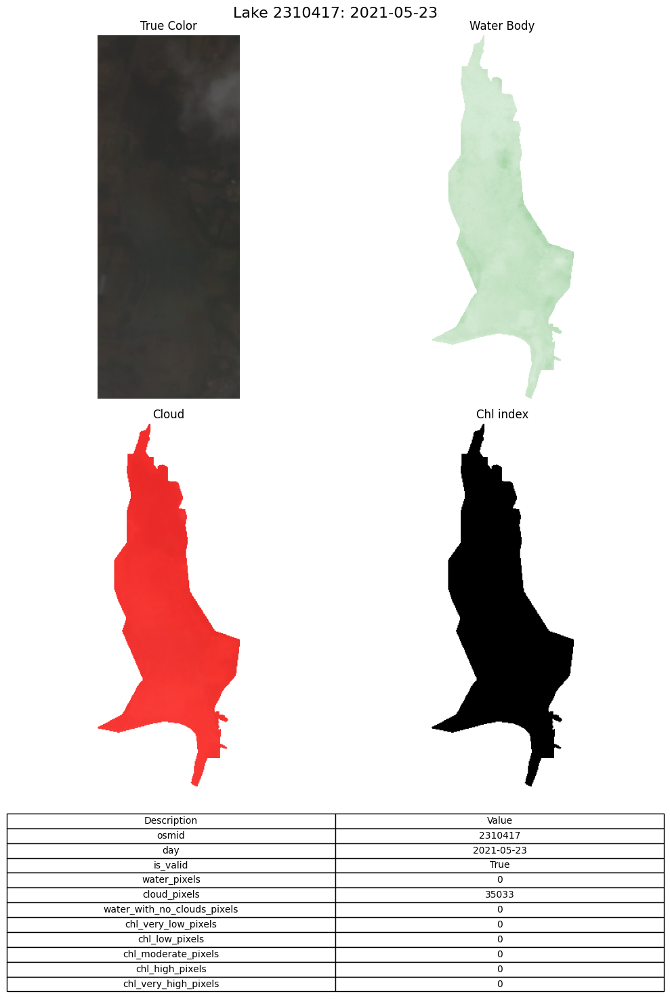

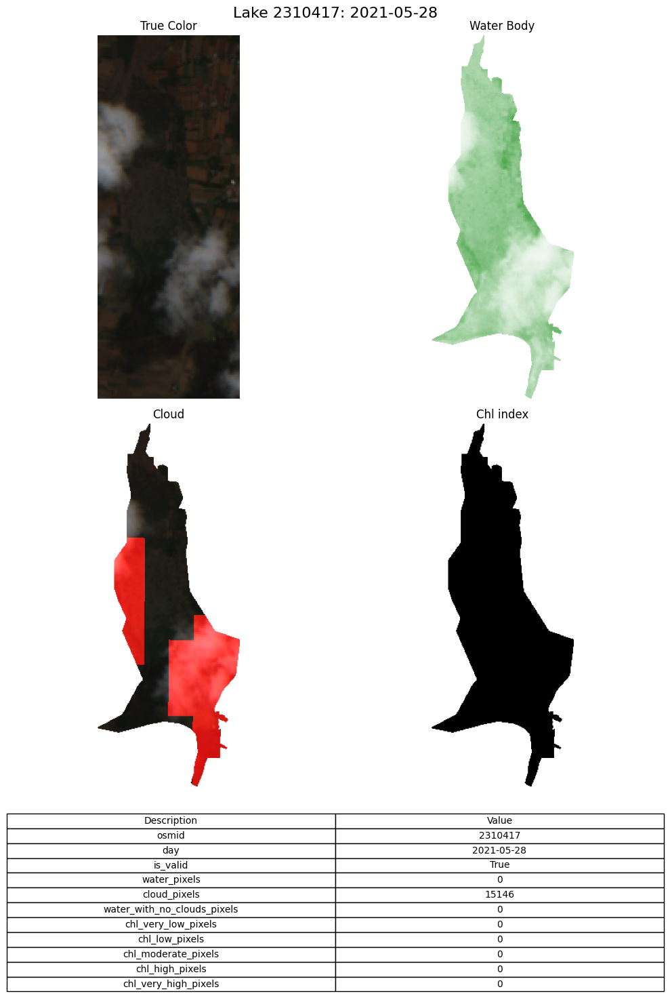

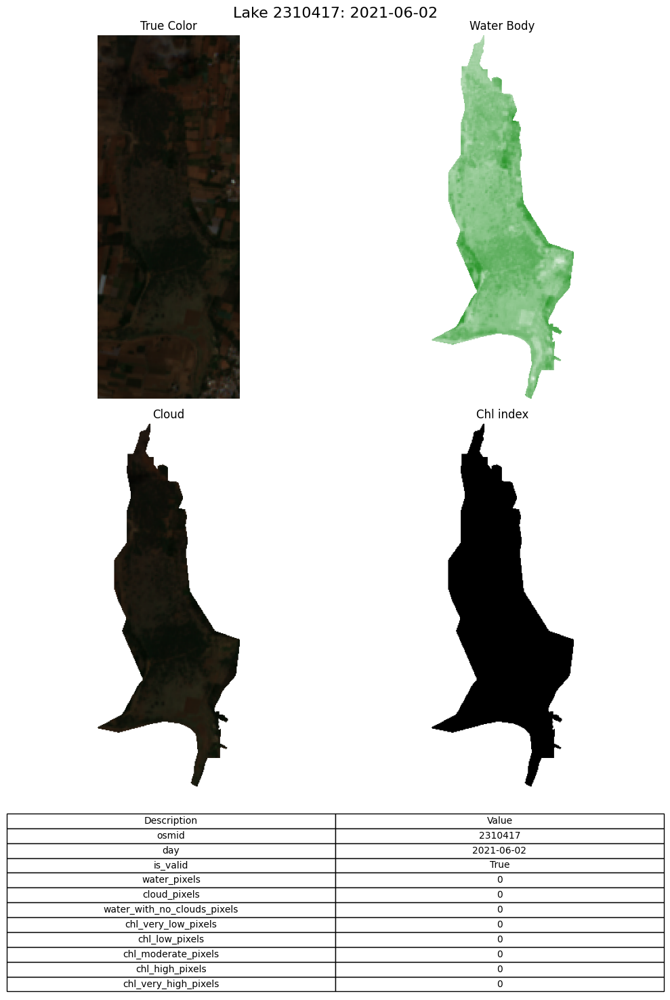

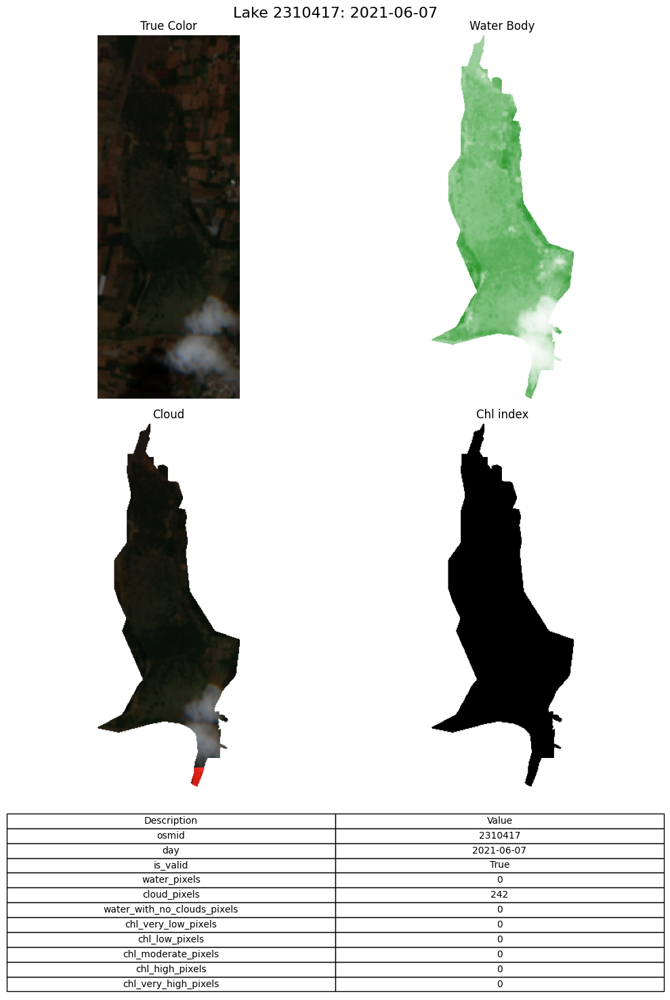

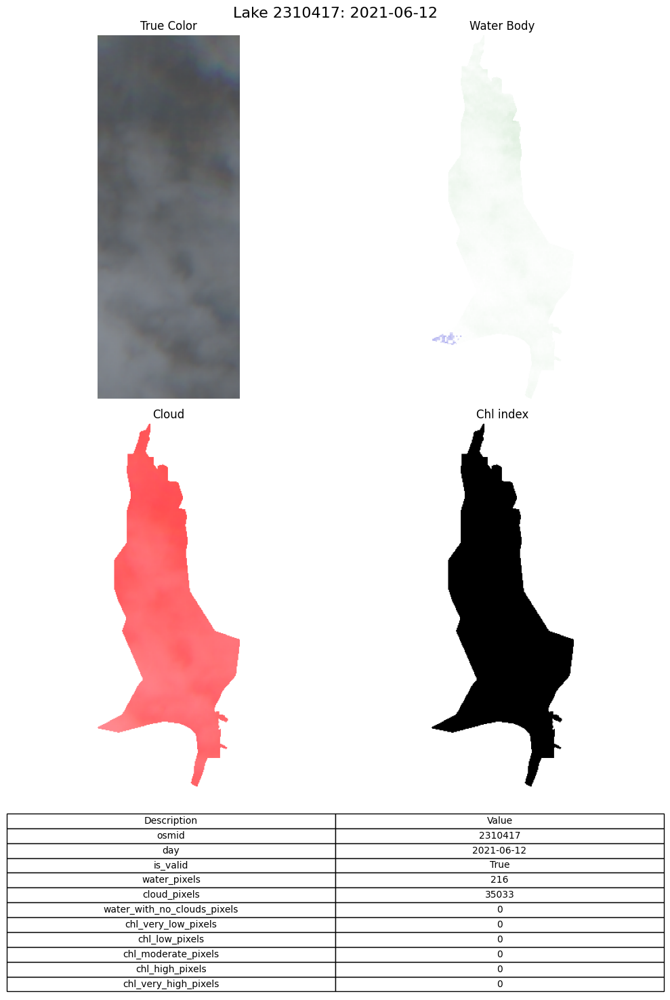

In [67]:
logs, images = utils.get_historical_lake_log(2310417, datetime(2021, 4, 1), datetime(2021, 6, 15))
utils.plot_historical_lake_logs(logs, images)

In [68]:
utils.calculate_pixel_size_and_pixel_count(2310417)

(5, 34349)

c:\Users\agand\OneDrive\Escritorio\lakes\lake-algae-analysis\notebooks\utils.py:661: UserWarning: The figure layout has changed to tight
  plt.tight_layout()


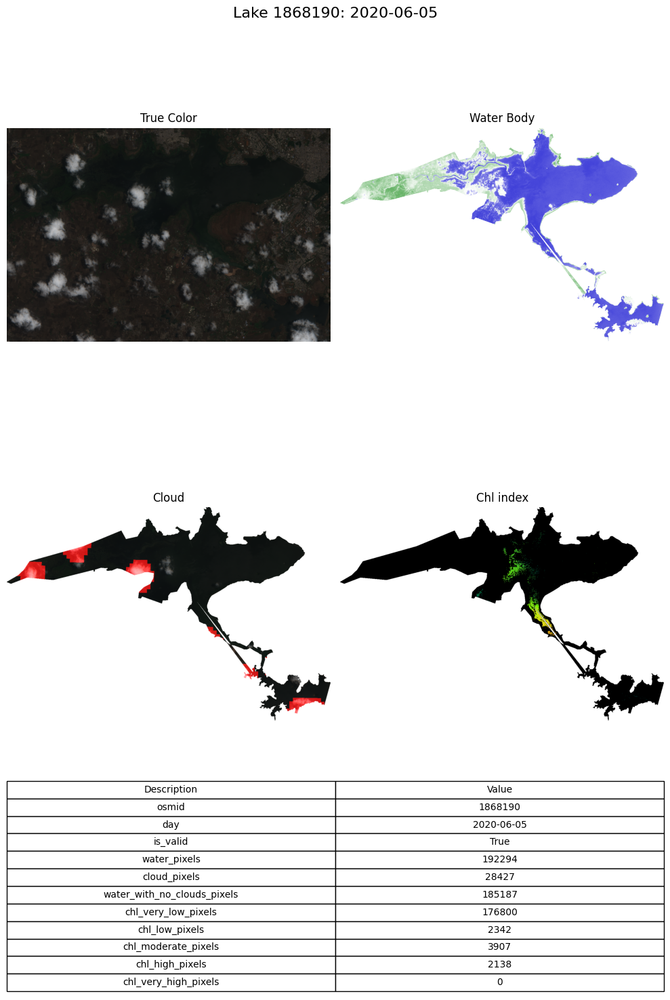

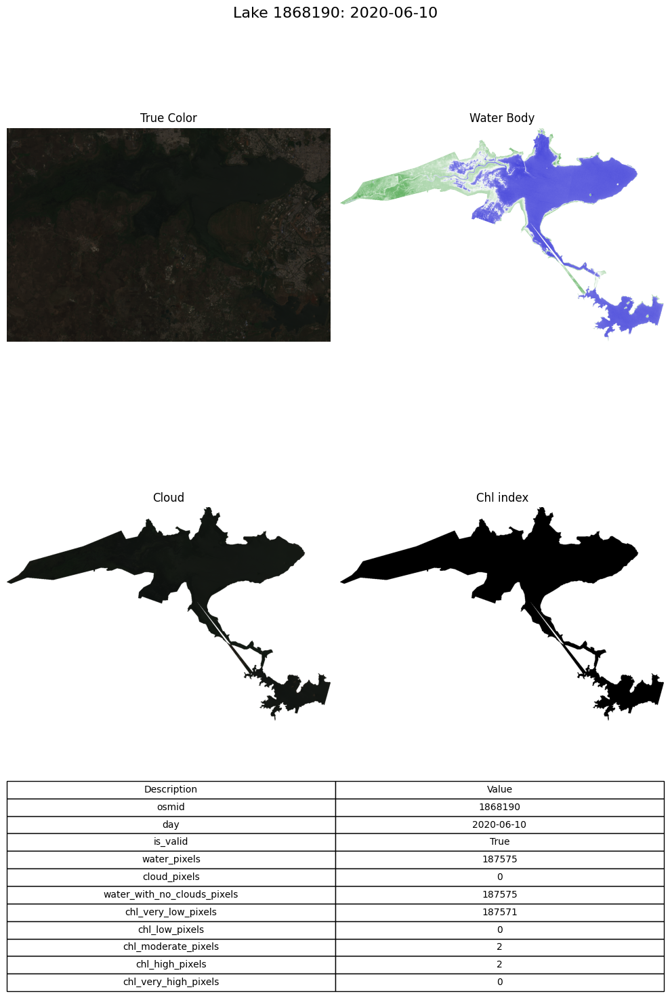

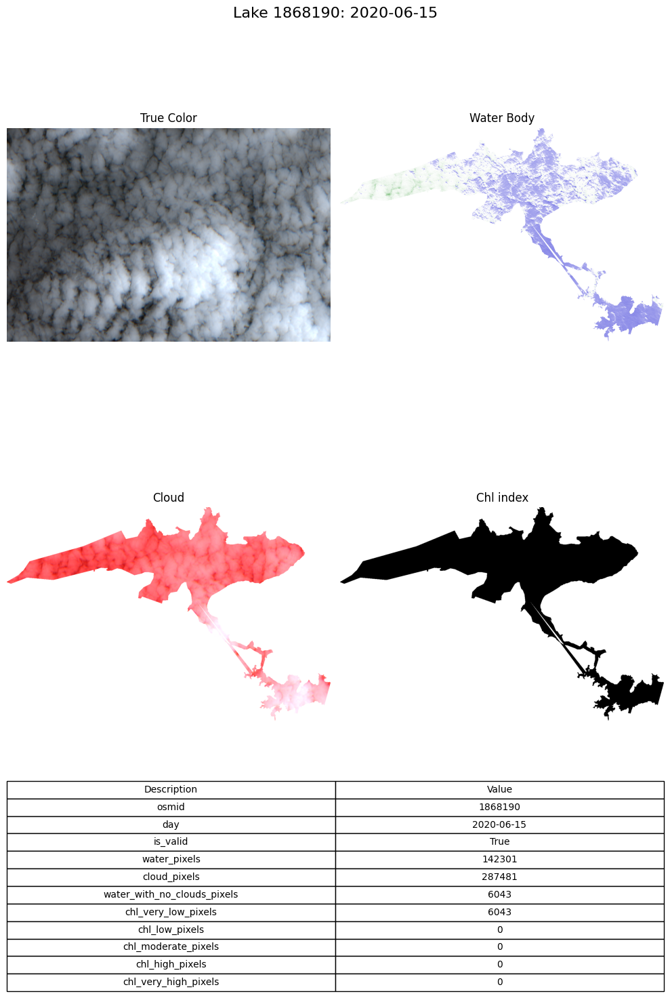

In [28]:
logs, images = utils.get_historical_lake_log(1868190, datetime(2020, 6, 1), datetime(2020, 6, 15))
utils.plot_historical_lake_logs(logs, images)

#### MultiPolygon

In [95]:
import importlib
import utils

importlib.reload(utils)

<module 'utils' from 'c:\\Users\\agand\\OneDrive\\Escritorio\\lakes\\lake-algae-analysis\\notebooks\\utils.py'>

In [96]:
lakes = utils.get_lakes(77.61, 12.90, 50000, 800000)

In [97]:
lakes

,osmid,name,geometry_ws,geometry,area,distance,centroid_ws,centroid,water
8,41667728,Hosakote lake,"POLYGON ((77.7715378 13.095815, 77.7736866 13....","POLYGON ((800539.513 1449379.519, 800781.072 1...",7.642900e+06,26894.275605,POINT (77.76662279551329 13.088231687218817),POINT (800015.3555747444 1448534.173779413),lake
5,41662659,Hesaraghatta Lake,"POLYGON ((77.5015 13.1785, 77.5005 13.17775, 7...","POLYGON ((771148.607 1458225.599, 771040.977 1...",5.381314e+06,31918.389557,POINT (77.49194990815423 13.164105368537838),POINT (770128.6395334302 1456622.073903532),reservoir
0,497729127,Kanva Reservoir,"POLYGON ((77.1940505 12.7216601, 77.1933612 12...","POLYGON ((738241.117 1407360.367, 738165.975 1...",3.517644e+06,47651.745473,POINT (77.2044770661294 12.735677477703248),POINT (739360.637014182 1408921.086913605),reservoir
14,367594186,Bellandur Lake,"POLYGON ((77.6589149 12.9369081, 77.6580512 12...","POLYGON ((788502.828 1431658.130, 788409.672 1...",3.191694e+06,6997.083200,POINT (77.66377952597225 12.934819163403626),POINT (789033.4122449829 1431432.3941486073),lake
1,8415449,NaN,"POLYGON ((77.3559403 12.9847013, 77.3560704 12...","POLYGON ((755562.203 1436624.963, 755576.801 1...",3.104181e+06,30126.114464,POINT (77.34409254159672 12.977829010089836),POINT (754283.3519222614 1435852.5500341584),reservoir
2,8415450,NaN,"POLYGON ((77.3271203 12.9017561, 77.3270559 12...","POLYGON ((752517.923 1427416.811, 752511.036 1...",2.627623e+06,30439.319630,POINT (77.32969407574475 12.89605210070272),POINT (752803.0782070878 1426788.0959056406),reservoir
3,486943399,Maidala Lake,"POLYGON ((77.1867811 13.3159334, 77.1868562 13...","POLYGON ((736885.735 1473115.581, 736893.605 1...",1.863447e+06,64185.928938,POINT (77.19497455092562 13.313310850174762),POINT (737776.2524524725 1472833.1886385875),reservoir
13,28043727,Varthur Lake,"POLYGON ((77.746825 12.9457215, 77.7469128 12....","POLYGON ((798037.457 1432734.666, 798046.890 1...",1.593162e+06,14648.136289,POINT (77.73603657296877 12.947165648532879),POINT (796864.3662777765 1432881.9677968698),lake
6,41667624,Bettakote Lake,"POLYGON ((77.7366495 13.2069212, 77.7276492 13...","POLYGON ((796619.917 1461637.873, 795641.751 1...",1.488656e+06,36842.410932,POINT (77.72544425768218 13.212973643350507),POINT (795397.286348182 1462294.63866578),lake
10,1092686472,Budigere Lake,"POLYGON ((77.7474338 13.1406096, 77.7463066 13...","POLYGON ((797869.899 1454309.812, 797746.914 1...",1.442322e+06,30953.185558,POINT (77.74532378429863 13.146120202296066),POINT (797634.3264358998 1454917.3505080792),pond


In [5]:
lakes

,element_type,osmid,name,geometry_ws,area,distance,centroid_ws,water
0,way,41667728,Hosakote lake,"POLYGON ((77.77154 13.09581, 77.77369 13.08891...",7.642900e+06,26894.275605,POINT (77.76662 13.08823),lake
1,way,41662659,Hesaraghatta Lake,"POLYGON ((77.50150 13.17850, 77.50050 13.17775...",5.381314e+06,31918.389557,POINT (77.49195 13.16411),reservoir
2,way,497729127,Kanva Reservoir,"POLYGON ((77.19405 12.72166, 77.19336 12.72194...",3.517644e+06,47651.745473,POINT (77.20448 12.73568),reservoir
3,way,367594186,Bellandur Lake,"POLYGON ((77.65891 12.93691, 77.65805 12.93637...",3.191694e+06,6997.083200,POINT (77.66378 12.93482),lake
4,relation,8415449,NaN,"POLYGON ((77.35594 12.98470, 77.35607 12.98423...",3.104181e+06,30126.114464,POINT (77.34409 12.97783),reservoir
5,relation,8415450,NaN,"POLYGON ((77.32712 12.90176, 77.32706 12.90165...",2.627623e+06,30439.319630,POINT (77.32969 12.89605),reservoir
6,way,486943399,Maidala Lake,"POLYGON ((77.18678 13.31593, 77.18686 13.31621...",1.863447e+06,64185.928938,POINT (77.19497 13.31331),reservoir
7,way,28043727,Varthur Lake,"POLYGON ((77.74683 12.94572, 77.74691 12.94581...",1.593162e+06,14648.136289,POINT (77.73604 12.94717),lake
8,way,41667624,Bettakote Lake,"POLYGON ((77.73665 13.20692, 77.72765 13.20856...",1.488656e+06,36842.410932,POINT (77.72544 13.21297),lake
9,way,1092686472,Budigere Lake,"POLYGON ((77.74743 13.14061, 77.74631 13.14118...",1.442322e+06,30953.185558,POINT (77.74532 13.14612),pond


In [7]:
madivala_lake = lakes.iloc[18]
multiPolygon = madivala_lake.geometry_ws
print(multiPolygon)

MULTIPOLYGON (((77.611476 12.9025757, 77.6115283 12.9026202, 77.6115914 12.9026136, 77.6116544 12.9025666, 77.6118249 12.9023483, 77.6120258 12.9021579, 77.6122751 12.9019729, 77.6126919 12.9017535, 77.6131626 12.9016011, 77.6135012 12.9015377, 77.6138216 12.9015129, 77.6144147 12.9015195, 77.6149991 12.9015391, 77.6161203 12.9016855, 77.6163134 12.9017352, 77.6163456 12.9017169, 77.6163429 12.9016803, 77.6162061 12.9015678, 77.6155236 12.9011079, 77.6150603 12.9005185, 77.614118 12.8994854, 77.6140027 12.8994069, 77.6139222 12.8993886, 77.6137988 12.8993952, 77.6133107 12.8995141, 77.6132181 12.8995168, 77.6131672 12.8994971, 77.6131269 12.8994501, 77.6129834 12.8985677, 77.6129512 12.8983572, 77.612907 12.8982461, 77.6128453 12.898182, 77.6126495 12.8981128, 77.612443 12.8980945, 77.6122941 12.8980853, 77.6121882 12.8981075, 77.612109 12.8981376, 77.6120836 12.8981938, 77.6121752 12.8986318, 77.6124883 12.8996064, 77.612462 12.8999449, 77.6123488 12.9000219, 77.6118621 12.9000783, 77

In [8]:
coords = []
for poly in multiPolygon.geoms:
    coords.append(list(poly.exterior.coords))

coords

[[(77.611476, 12.9025757),
  (77.6115283, 12.9026202),
  (77.6115914, 12.9026136),
  (77.6116544, 12.9025666),
  (77.6118249, 12.9023483),
  (77.6120258, 12.9021579),
  (77.6122751, 12.9019729),
  (77.6126919, 12.9017535),
  (77.6131626, 12.9016011),
  (77.6135012, 12.9015377),
  (77.6138216, 12.9015129),
  (77.6144147, 12.9015195),
  (77.6149991, 12.9015391),
  (77.6161203, 12.9016855),
  (77.6163134, 12.9017352),
  (77.6163456, 12.9017169),
  (77.6163429, 12.9016803),
  (77.6162061, 12.9015678),
  (77.6155236, 12.9011079),
  (77.6150603, 12.9005185),
  (77.614118, 12.8994854),
  (77.6140027, 12.8994069),
  (77.6139222, 12.8993886),
  (77.6137988, 12.8993952),
  (77.6133107, 12.8995141),
  (77.6132181, 12.8995168),
  (77.6131672, 12.8994971),
  (77.6131269, 12.8994501),
  (77.6129834, 12.8985677),
  (77.6129512, 12.8983572),
  (77.612907, 12.8982461),
  (77.6128453, 12.898182),
  (77.6126495, 12.8981128),
  (77.612443, 12.8980945),
  (77.6122941, 12.8980853),
  (77.6121882, 12.8981075

In [12]:
geojson = {"type": "MultiPolygon", "coordinates": [coords]}
geojson_filename = f"../aoi/{2310417}.geojson"
with open(geojson_filename, "w") as f:
    json.dump(geojson, f, indent=4)

In [24]:
gdf = gpd.read_file(geojson_filename)

In [25]:
gdf

,geometry
0,"MULTIPOLYGON (((77.61148 12.90258, 77.61153 12..."


In [26]:
minx, miny, maxx, maxy = gdf.total_bounds

In [27]:
print(minx, miny, maxx, maxy)

77.611405 12.8980853 77.6163456 12.9026202


In [13]:
pixel_size, pixel_count = utils.calculate_pixel_size_and_pixel_count(2310417)

In [17]:
geojson

{'type': 'MultiPolygon',
 'coordinates': [[[(77.611476, 12.9025757),
    (77.6115283, 12.9026202),
    (77.6115914, 12.9026136),
    (77.6116544, 12.9025666),
    (77.6118249, 12.9023483),
    (77.6120258, 12.9021579),
    (77.6122751, 12.9019729),
    (77.6126919, 12.9017535),
    (77.6131626, 12.9016011),
    (77.6135012, 12.9015377),
    (77.6138216, 12.9015129),
    (77.6144147, 12.9015195),
    (77.6149991, 12.9015391),
    (77.6161203, 12.9016855),
    (77.6163134, 12.9017352),
    (77.6163456, 12.9017169),
    (77.6163429, 12.9016803),
    (77.6162061, 12.9015678),
    (77.6155236, 12.9011079),
    (77.6150603, 12.9005185),
    (77.614118, 12.8994854),
    (77.6140027, 12.8994069),
    (77.6139222, 12.8993886),
    (77.6137988, 12.8993952),
    (77.6133107, 12.8995141),
    (77.6132181, 12.8995168),
    (77.6131672, 12.8994971),
    (77.6131269, 12.8994501),
    (77.6129834, 12.8985677),
    (77.6129512, 12.8983572),
    (77.612907, 12.8982461),
    (77.6128453, 12.898182),
    

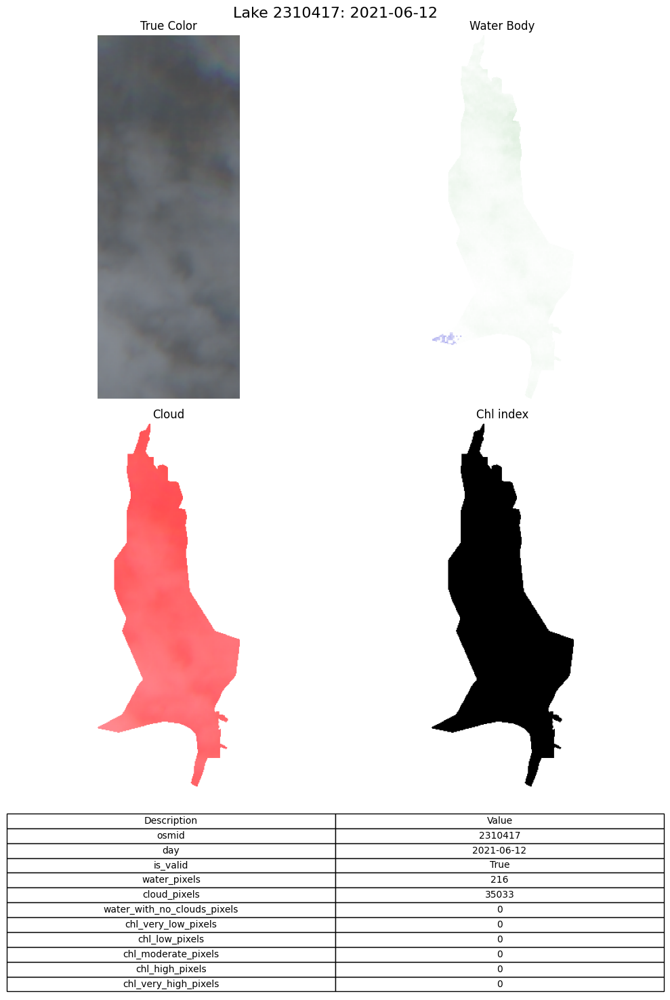

In [23]:
log, images = utils.get_lake_log(2310417, datetime(2021, 6, 12))
utils.plot_log(log, images)

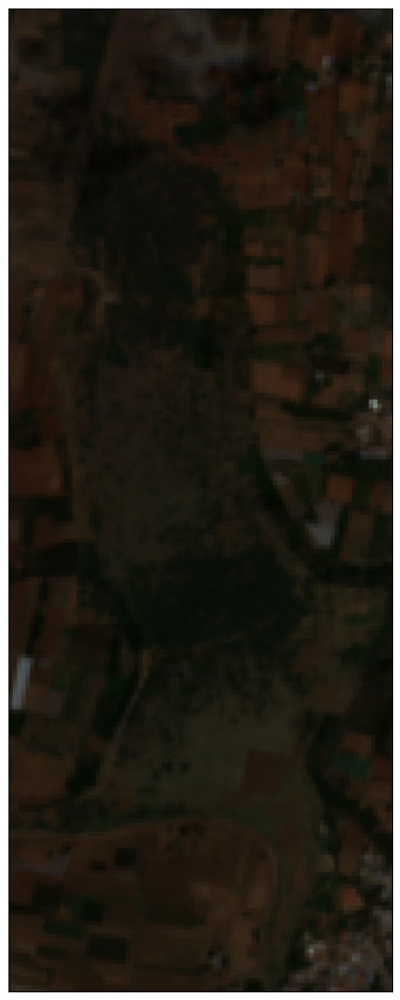